In [1]:
!pip install pytorch-ignite

In [2]:
import torch
import torchvision
import ignite

print(*map(lambda m: ": ".join((m.__name__, m.__version__)), (torch, torchvision, ignite)), sep="\n")

torch: 2.3.0
torchvision: 0.18.0
ignite: 0.5.0.post2


In [3]:
import os
import logging
import matplotlib.pyplot as plt

import numpy as np

from torchsummary import summary

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision.transforms as transforms
import torchvision.utils as vutils

from ignite.engine import Engine, Events
import ignite.distributed as idist

In [4]:
from torch.utils.data import DataLoader, Subset, random_split

In [5]:
ignite.utils.manual_seed(999)

Optionally, the `logging` level `logging.WARNING` is used in internal `ignite` submodules in order to avoid internal messages.

In [6]:
ignite.utils.setup_logger(name="ignite.distributed.auto.auto_dataloader", level=logging.WARNING)
ignite.utils.setup_logger(name="ignite.distributed.launcher.Parallel", level=logging.WARNING)

<Logger ignite.distributed.launcher.Parallel (WARNING)>

In [7]:
from torchvision.datasets import ImageFolder

In [8]:
# !gdown --id 1O8LE-FpN79Diu6aCvppH5HwlcR5I--PX
# !mkdir data
# !unzip -qq img_align_celeba.zip -d data

In [9]:
import os
import glob

# Define the directory path where files have been unzipped
directory_path = r'D:\Semester 4\Deep Learning\anime'

# List all files in the directory
all_files = glob.glob(os.path.join(directory_path, '**', '*'), recursive=True)

# Print all files
print("All files:")
for file in all_files:
    print(file)

# Select specific files (e.g., only JPEG images)
jpeg_files = glob.glob(os.path.join(directory_path, '**', '*.jpg'), recursive=True)

# Print selected JPEG files
print("\nSelected JPEG files:")
for file in jpeg_files:
    print(file)

All files:
D:\Semester 4\Deep Learning\anime\images
D:\Semester 4\Deep Learning\anime\images\0_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10000_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10001_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10002_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10003_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10004_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10005_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10006_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10007_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10008_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10009_2004.jpg
D:\Semester 4\Deep Learning\anime\images\1000_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10010_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10011_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10012_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10013_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10014_2004.jpg
D

The image size considered in this tutorial is `64`. Note that increase this size implies to modify the GAN models.

In [10]:
image_size = 64

data_transform = transforms.Compose(
    [
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

train_dataset = ImageFolder(root="./anime", transform=data_transform)

# Split dataset into train and test
test_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - test_size
train_dataset, test_dataset = random_split(train_dataset, [train_size, test_size])

### DataLoading

In [11]:
batch_size = 128

train_dataloader = idist.auto_dataloader(
    train_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=True, 
    drop_last=True,
)

test_dataloader = idist.auto_dataloader(
    test_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=False, 
    drop_last=True,
)

Let's explore the data.

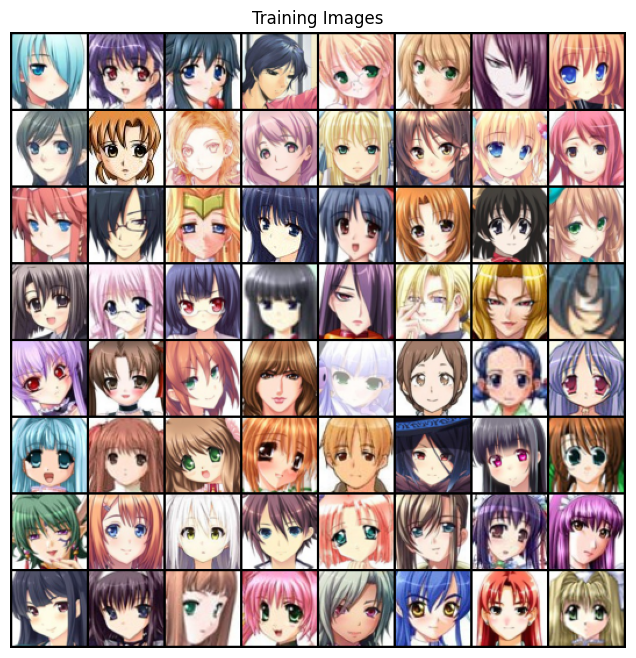

In [12]:
real_batch = next(iter(train_dataloader))

# Display the images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

## Models for GAN

In [13]:
latent_dim = 100

In [14]:
import torch.nn as nn
import torch.nn.utils.spectral_norm as spectral_norm

class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # state size. 512 x 4 x 4
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # state size. 256 x 8 x 8
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # state size. 128 x 16 x 16
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # state size. 64 x 32 x 32
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # final state size. 3 x 64 x 64
        )

    def forward(self, x):
        x = self.model(x)
        return x


As for dataloading, distributed models requires some specifics that `idist` adresses providing the [`auto_model`](https://pytorch.org/ignite/v0.4.5/generated/ignite.distributed.auto.auto_model.html#auto-model) helper.

In [15]:
netG = idist.auto_model(Generator(latent_dim))

Note that the model is automatically moved to the best device detected by `idist`.

In [16]:
idist.device()

device(type='cuda')

In [17]:
summary(netG, (latent_dim, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 32]          128
|    └─ReLU: 2-12                        [-1, 64, 32, 32]

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 32]          128
|    └─ReLU: 2-12                        [-1, 64, 32, 32]

### Discriminator

In [18]:
class DiscriminatorSNGAN(nn.Module):
    def __init__(self):
        super(DiscriminatorSNGAN, self).__init__()
        self.model = nn.Sequential(
            # input is 3 x 64 x 64
            spectral_norm(nn.Conv2d(3, 64, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 64 x 32 x 32
            spectral_norm(nn.Conv2d(64, 128, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 128 x 16 x 16
            spectral_norm(nn.Conv2d(128, 256, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 256 x 8 x 8
            spectral_norm(nn.Conv2d(256, 512, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 512 x 4 x 4
            spectral_norm(nn.Conv2d(512, 1, 4, 1, 0, bias=False)),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x)
        return x


In [19]:
netD = idist.auto_model(DiscriminatorSNGAN())
summary(netD, (3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-4                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-7                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-10                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

## Optimizers

The [Binary Cross Entropy Loss](https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss) is used in this tutorial.

In [20]:
criterion = nn.BCELoss()

A batch of `64` fixed samples will be used for generating images from throughout the training. This will allow a qualitative evaluation throughout the training progress.

In [21]:
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=idist.device())

Finally, two separate optimizers are set up, one for the generator, and one for the discriminator. Yet, another helper method [`auto_optim`](https://pytorch.org/ignite/v0.4.5/generated/ignite.distributed.auto.auto_optim.html#auto-optim) provided by `idist` will help to adapt optimizer for distributed configurations. 

In [22]:
optimizerD = idist.auto_optim(
    optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

optimizerG = idist.auto_optim(
    optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

In [23]:
real_label = 1
fake_label = 0


def training_step(engine, data):
    # Set the models for training
    netG.train()
    netD.train()

    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real = data[0].to(idist.device())
    b_size = real.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=idist.device())
    # Forward pass real batch through D
    output1 = netD(real).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output1, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, latent_dim, 1, 1, device=idist.device())
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output2 = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output2, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output3 = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output3, label)
    # Calculate gradients for G
    errG.backward()
    # Update G
    optimizerG.step()

    return {
        "Loss_G" : errG.item(),
        "Loss_D" : errD.item(),
        "D_x": output1.mean().item(),
        "D_G_z1": output2.mean().item(),
        "D_G_z2": output3.mean().item(),
    }

A `PyTorch-Ignite` engine `trainer` is defined using the above `training_step` function.

In [24]:
trainer = Engine(training_step)

### Handlers
In this section, the used `PyTorch-Ignite` handlers are introduced. These handlers will be responsible for printing out and storing important information such as losses and model predictions.

Like the DCGAN paper, we will also randomly initialize all the model weights from a Normal Distribution with `mean=0`, `stdev=0.02`. The following `initialize_fn` function must be applied to the generator and discriminator models at the start of training.

In [25]:
def initialize_fn(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

The following `init_weights` handler is triggered at the start of the engine run and it is responsible for applying the `initialize_fn` function to randomly generate weights for the Generator `netD` and the Discriminator `netG`.

In [26]:
@trainer.on(Events.STARTED)
def init_weights():
    netD.apply(initialize_fn)
    netG.apply(initialize_fn)

The `store_losses` handler is responsible for storing the generator and discriminator losses in `G_losses` and `D_losses` respectively. It is triggered at the end of every iteration.

In [27]:
from ignite.handlers import Timer
timer = Timer(average=True)

@trainer.on(Events.STARTED)
def start_timer(engine):
    timer.reset()


In [28]:
G_losses = []
D_losses = []


@trainer.on(Events.ITERATION_COMPLETED)
def store_losses(engine):
    o = engine.state.output
    G_losses.append(o["Loss_G"])
    D_losses.append(o["Loss_D"])

The `store_images` handler is responsible for storing the images generated by the generator model during training. It provides us with a visual progress of the training. It is triggered every `500` iterations.

In [29]:
img_list = []


@trainer.on(Events.ITERATION_COMPLETED(every=500))
def store_images(engine):
    with torch.no_grad():
        fake = netG(fixed_noise).cpu()
    img_list.append(fake)

In [30]:
from ignite.metrics import FID, InceptionScore

In [31]:
fid_metric = FID(device=idist.device())

In [32]:
is_metric = InceptionScore(device=idist.device(), output_transform=lambda x: x[0])

In [33]:
import PIL.Image as Image


def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)


def evaluation_step(engine, batch):
    with torch.no_grad():
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=idist.device())
        netG.eval()
        fake_batch = netG(noise)
        fake = interpolate(fake_batch)
        real = interpolate(batch[0])
        return fake, real

The `train_evaluator` engine will run the metric on the entire dataset every epoch and attach `IS` and `FID` metrics to it.

In [34]:
evaluator = Engine(evaluation_step)
fid_metric.attach(evaluator, "fid")
is_metric.attach(evaluator, "is")

The following handler attached to the `trainer` engine triggered every epoch will run the `train_evaluator` engine to evaluate the `IS` and `FID` metrics. The results are finally stored per epoch.

In [35]:
fid_values = []
is_values = []


@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(engine):

    evaluator.run(test_dataloader,max_epochs=1)
    metrics = evaluator.state.metrics
    fid_score = metrics['fid']
    is_score = metrics['is']
    fid_values.append(fid_score)
    is_values.append(is_score)
    print(f"Epoch [{engine.state.epoch}/20] Metric Scores")
    print(f"*   FID : {fid_score:4f}")
    print(f"*    IS : {is_score:4f}")
    print(f"Epoch {engine.state.epoch} completed in {timer.value():.2f} seconds")


## Loss metrics

The `RunningAverage` metric is used to keep track of the generator and discriminator Losses. Like the name suggests, `RunningAverage` keeps the track of average of all the values provided to it.

In [36]:
from ignite.metrics import RunningAverage


RunningAverage(output_transform=lambda x: x["Loss_G"]).attach(trainer, 'Loss_G')
RunningAverage(output_transform=lambda x: x["Loss_D"]).attach(trainer, 'Loss_D')

## Progress bars

Since the training process can take a lot of time and have a lot of iterations and epochs, a `ProgressBar` handler is added to show progress to prevent all the training data from filling up our screen.



In [37]:
from ignite.contrib.handlers import ProgressBar


ProgressBar().attach(trainer, metric_names=['Loss_G','Loss_D'])
ProgressBar().attach(evaluator)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\ignite\handlers\tqdm_logger.py:127: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## Training

Finally, the `trainer` engine is run here. The helper method [`Parallel`](https://pytorch.org/ignite/v0.4.5/generated/ignite.distributed.launcher.Parallel.html#parallel) of `idist` will help setting up a distributed configuration to run the `trainer` engine. It supports  `nccl`, `gloo` and `mpi` native torch backends, `XLA` on `TPU` and `Horovod` distributed framework.

In [38]:
def training(*args):
    trainer.run(train_dataloader, max_epochs=20)

In [39]:
with idist.Parallel(backend='gloo') as parallel:
    parallel.run(training)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [1/20] Metric Scores
*   FID : 0.070204
*    IS : 1.256194
Epoch 1 completed in 197.80 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [2/20] Metric Scores
*   FID : 0.068849
*    IS : 1.357163
Epoch 2 completed in 435.38 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [3/20] Metric Scores
*   FID : 0.076612
*    IS : 1.511853
Epoch 3 completed in 672.03 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [4/20] Metric Scores
*   FID : 0.055206
*    IS : 1.626885
Epoch 4 completed in 908.04 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [5/20] Metric Scores
*   FID : 0.046906
*    IS : 1.828177
Epoch 5 completed in 1128.78 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [6/20] Metric Scores
*   FID : 0.055323
*    IS : 1.982589
Epoch 6 completed in 1308.80 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [7/20] Metric Scores
*   FID : 0.033425
*    IS : 1.971038
Epoch 7 completed in 1527.27 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [8/20] Metric Scores
*   FID : 0.040188
*    IS : 1.858616
Epoch 8 completed in 1745.51 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [9/20] Metric Scores
*   FID : 0.042380
*    IS : 2.000166
Epoch 9 completed in 1926.02 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [10/20] Metric Scores
*   FID : 0.025375
*    IS : 1.887013
Epoch 10 completed in 2144.96 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [11/20] Metric Scores
*   FID : 0.025577
*    IS : 1.994740
Epoch 11 completed in 2365.70 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [12/20] Metric Scores
*   FID : 0.039803
*    IS : 1.980028
Epoch 12 completed in 2546.22 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [13/20] Metric Scores
*   FID : 0.023979
*    IS : 2.054766
Epoch 13 completed in 2764.08 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [14/20] Metric Scores
*   FID : 0.019918
*    IS : 1.967364
Epoch 14 completed in 2982.69 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [15/20] Metric Scores
*   FID : 0.023999
*    IS : 1.878158
Epoch 15 completed in 3163.84 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [16/20] Metric Scores
*   FID : 0.037497
*    IS : 1.947422
Epoch 16 completed in 3380.19 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [17/20] Metric Scores
*   FID : 0.028974
*    IS : 1.915842
Epoch 17 completed in 3601.79 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [18/20] Metric Scores
*   FID : 0.026857
*    IS : 1.840892
Epoch 18 completed in 3781.85 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [19/20] Metric Scores
*   FID : 0.024557
*    IS : 1.930101
Epoch 19 completed in 3999.53 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [20/20] Metric Scores
*   FID : 0.030002
*    IS : 1.986196
Epoch 20 completed in 4218.13 seconds


## Inference

Finally, let's check out the results. First, how the discriminator's and generator’s losses changed during training. Second, the `FID` and `IS` performance improvments of the model. And last, look a batch of real data next to a batch of fake data from the generator.

**Losses versus training iterations**

Below is a plot of the discriminator's and generator’s losses versus training iterations.

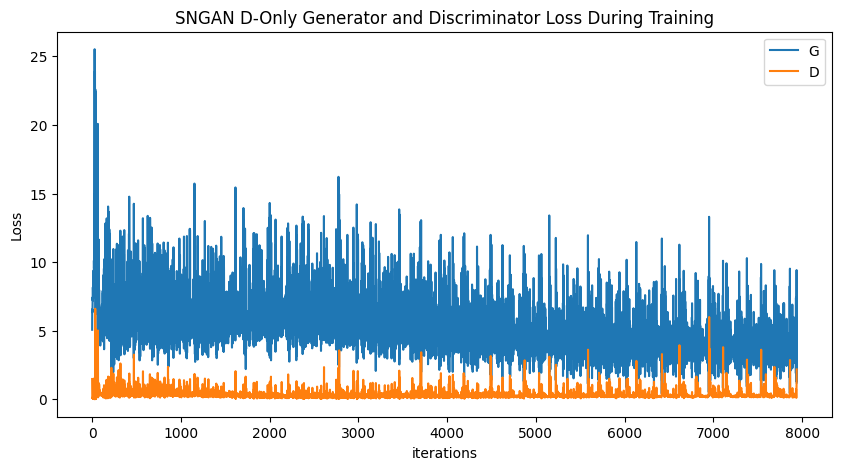

In [43]:
%matplotlib inline

plt.figure(figsize=(10,5))
plt.title("SNGAN D-Only Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()

**Evaluation Metric versus training iterations**

Below is a plot of Evaluation versus training iterations.
As we can see `IS` increases sharply at first indicating the generator model is learning quickly how to generate faces. Unlike `IS`, `FID` is decreasing sharply at first similarly indicating the learning process of the generator model. 

Note: Higher value of `FID` implies better results and lower value of `IS` implies better results.

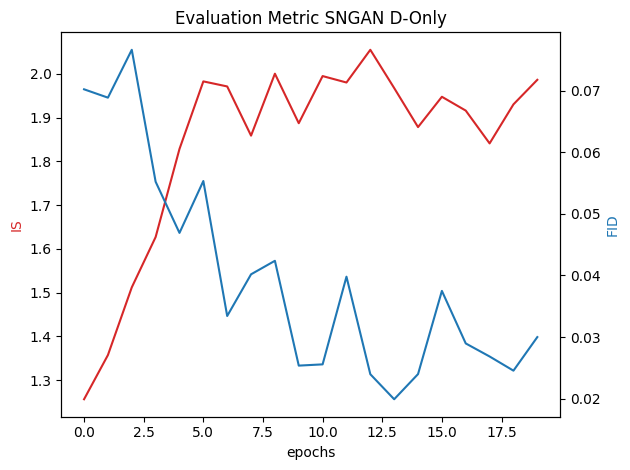

In [44]:
fig, ax1 = plt.subplots()

plt.title("Evaluation Metric SNGAN D-Only")

color = 'tab:red'
ax1.set_xlabel('epochs')
ax1.set_ylabel('IS', color=color)
ax1.plot(is_values, color=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('FID', color=color)
ax2.plot(fid_values, color=color)

fig.tight_layout()

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by side.



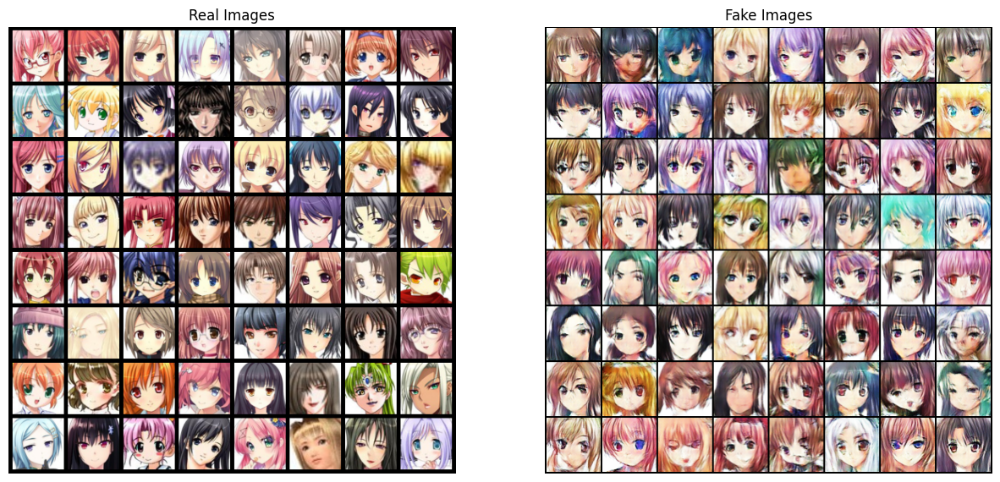

In [42]:
%matplotlib inline

# Grab a batch of real images from the dataloader
real_batch = next(iter(train_dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(img_list[-1], padding=2, normalize=True).cpu(),(1,2,0)))